# Dubai Satellite Imagery Multiclass Segmentation
## Augmented Dataset Generation

In this notebook, the small dataset consisting of 72 images (8 Tiles with 9 images each) is augmented to increase the number of images for both the images and corresponding masks:
- <strong>Original Dataset</strong>: 72 images (8 Tiles with 9 images each)
- This is split into <strong>Training set: 56 (8 Tiles, first 7 images)</strong> <strong>Validation set: 16 (8 Tiles, last 2 images)</strong>
- Subsequently, the 56 images in the training set are augmented: Each image is augmented 8 times (56 * 8 = 448) and the original 56 are also retained, <strong>Total Augmented Training set: 484 + 56 = 504</strong>

## Installing & Importing Libraries

In [1]:
import pickle
import numpy as np
import pandas as pd
from PIL import Image
import albumentations as A
from IPython.display import SVG
import matplotlib.pyplot as plt
%matplotlib inline
import os, re, sys, random, shutil, cv2

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam, Nadam
from tensorflow.keras import applications, optimizers
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.applications.resnet50 import preprocess_input

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.utils import model_to_dot, plot_model
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, CSVLogger, LearningRateScheduler
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, ZeroPadding2D, Dropout

## Data Augmentation using Albumentations Library
[Albumentations](https://albumentations.ai/) is a Python library for fast and flexible image augmentations. Albumentations efficiently implements a rich variety of image transform operations that are optimized for performance, and does so while providing a concise, yet powerful image augmentation interface for different computer vision tasks, including object classification, segmentation, and detection.

Data augmentation is done by the following techniques:

1. Random Cropping
2. Horizontal Flipping
3. Vertical Flipping
4. Rotation
5. Random Brightness & Contrast
6. Contrast Limited Adaptive Histogram Equalization (CLAHE)
7. Grid Distortion
8. Optical Distortion

In [2]:
def augment(width, height):
    transform = A.Compose([
        A.RandomCrop(width=width, height=height, p=1.0),
        A.HorizontalFlip(p=1.0),
        A.VerticalFlip(p=1.0),
        A.Rotate(limit=[60, 300], p=1.0, interpolation=cv2.INTER_NEAREST),
        A.RandomBrightnessContrast(brightness_limit=[-0.2, 0.3], contrast_limit=0.2, p=1.0),
        A.OneOf([
            A.CLAHE (clip_limit=1.5, tile_grid_size=(8, 8), p=0.5),
            A.GridDistortion(p=0.5),
            A.OpticalDistortion(distort_limit=1, shift_limit=0.5, interpolation=cv2.INTER_NEAREST, p=0.5),
        ], p=1.0),
    ], p=1.0)
    
    return transform

In [3]:
def visualize(image, mask, original_image=None, original_mask=None):
    fontsize = 16

    if original_image is None and original_mask is None:
        f, ax = plt.subplots(2, 1, figsize=(10, 10), squeeze=True)
        f.set_tight_layout(h_pad=5, w_pad=5)

        ax[0].imshow(image)
        ax[1].imshow(mask)
    else:
        f, ax = plt.subplots(2, 2, figsize=(16, 12), squeeze=True)
        plt.tight_layout(pad=0.2, w_pad=1.0, h_pad=0.01)

        ax[0, 0].imshow(original_image)
        ax[0, 0].set_title('Original Image', fontsize=fontsize)

        ax[1, 0].imshow(original_mask)
        ax[1, 0].set_title('Original Mask', fontsize=fontsize)

        ax[0, 1].imshow(image)
        ax[0, 1].set_title('Transformed Image', fontsize=fontsize)

        ax[1, 1].imshow(mask)
        ax[1, 1].set_title('Transformed Mask', fontsize=fontsize)
        
    !mkdir './Output'    
    plt.savefig('./Output/sample_augmented_image.png', facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 100)

In [4]:
# Constructing the Data directory file structure
# Iterating through all the 8 tiles
for tile in range(1, 8+1):
    # Iterating through 7 images in each tile (leaving 2 for validation)
    for i in range(1, 7+1):
        src_img = f'./Semantic segmentation dataset/Tile {tile}/images/image_part_00{i}.jpg'
        src_mask = f'./Semantic segmentation dataset/Tile {tile}/masks/image_part_00{i}.png'
        dest_img = f'./Data/train_images/image_t{tile}_00{i}.jpg'
        dest_mask = f'./Data/train_masks/image_t{tile}_00{i}.png'
        os.makedirs(os.path.dirname(dest_img), exist_ok=True)
        os.makedirs(os.path.dirname(dest_mask), exist_ok=True)
        new_path_img = shutil.copy(src_img, dest_img)
        new_path_mask = shutil.copy(src_mask, dest_mask)
        print(new_path_img)
        print(new_path_mask)

./Data/train_images/image_t1_001.jpg
./Data/train_masks/image_t1_001.png
./Data/train_images/image_t1_002.jpg
./Data/train_masks/image_t1_002.png
./Data/train_images/image_t1_003.jpg
./Data/train_masks/image_t1_003.png
./Data/train_images/image_t1_004.jpg
./Data/train_masks/image_t1_004.png
./Data/train_images/image_t1_005.jpg
./Data/train_masks/image_t1_005.png
./Data/train_images/image_t1_006.jpg
./Data/train_masks/image_t1_006.png
./Data/train_images/image_t1_007.jpg
./Data/train_masks/image_t1_007.png
./Data/train_images/image_t2_001.jpg
./Data/train_masks/image_t2_001.png
./Data/train_images/image_t2_002.jpg
./Data/train_masks/image_t2_002.png
./Data/train_images/image_t2_003.jpg
./Data/train_masks/image_t2_003.png
./Data/train_images/image_t2_004.jpg
./Data/train_masks/image_t2_004.png
./Data/train_images/image_t2_005.jpg
./Data/train_masks/image_t2_005.png
./Data/train_images/image_t2_006.jpg
./Data/train_masks/image_t2_006.png
./Data/train_images/image_t2_007.jpg
./Data/train_m

image_t8_001


A subdirectory or file ./Output already exists.
The syntax of the command is incorrect.


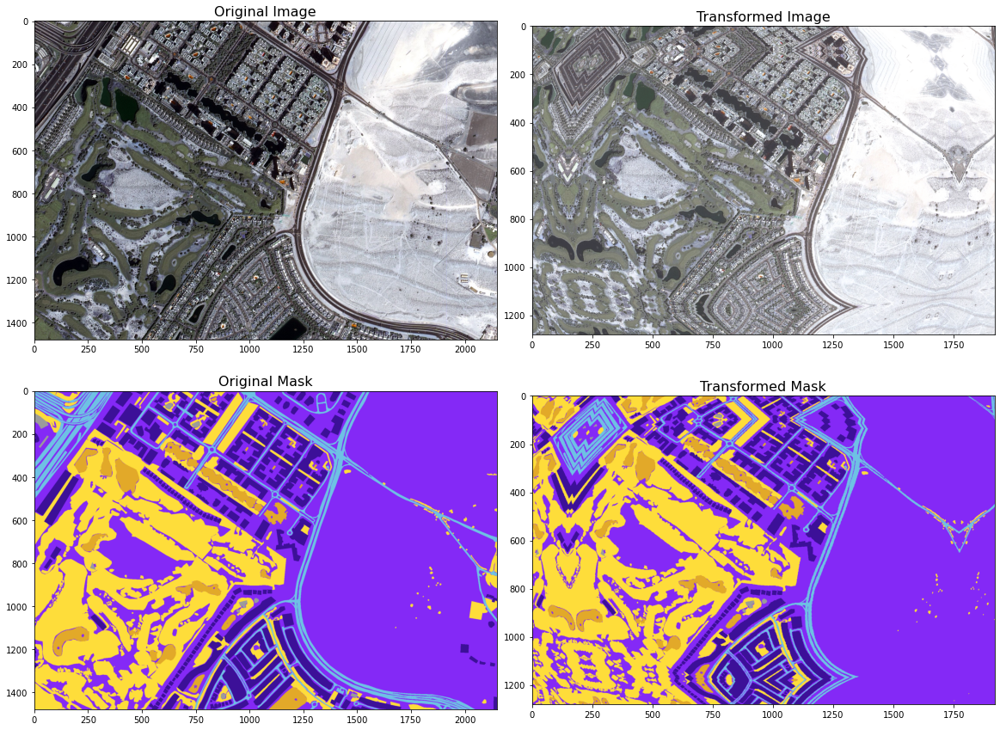

In [5]:
import random

sample_image = random.choice(['image_t8_001',
                              'image_t8_002',
                              'image_t8_003',
                              'image_t8_005',
                              'image_t8_007'])
print(sample_image)

!mkdir "./Output"
image = cv2.imread(f'./Data/train_images/{sample_image}.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
mask = cv2.imread(f'./Data/train_masks/{sample_image}.png')
mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

transform = augment(1920, 1280)
transformed = transform(image=image, mask=mask)
transformed_image = transformed['image']
transformed_mask = transformed['mask']

cv2.imwrite('./Output/image.png',cv2.cvtColor(transformed_image, cv2.COLOR_BGR2RGB))
cv2.imwrite('./Output/mask.png',cv2.cvtColor(transformed_mask, cv2.COLOR_BGR2RGB))

visualize(transformed_image, transformed_mask, image, mask)

# Saving Augmented Images to Disk
I have already performed data augmentation and saved the images. I am not running it's code in this notebook. It is a very time consuming process, so be patient while the code cell runs!

In [6]:
images_dir = './Data/train_images/'
masks_dir = './Data/train_masks/'

['image_t1_001' 'image_t1_002' 'image_t1_003' 'image_t1_004'
 'image_t1_005' 'image_t1_006' 'image_t1_007' 'image_t2_001'
 'image_t2_002' 'image_t2_003' 'image_t2_004' 'image_t2_005'
 'image_t2_006' 'image_t2_007' 'image_t3_001' 'image_t3_002'
 'image_t3_003' 'image_t3_004' 'image_t3_005' 'image_t3_006'
 'image_t3_007' 'image_t4_001' 'image_t4_002' 'image_t4_003'
 'image_t4_004' 'image_t4_005' 'image_t4_006' 'image_t4_007'
 'image_t5_001' 'image_t5_002' 'image_t5_003' 'image_t5_004'
 'image_t5_005' 'image_t5_006' 'image_t5_007' 'image_t6_001'
 'image_t6_002' 'image_t6_003' 'image_t6_004' 'image_t6_005'
 'image_t6_006' 'image_t6_007' 'image_t7_001' 'image_t7_002'
 'image_t7_003' 'image_t7_004' 'image_t7_005' 'image_t7_006'
 'image_t7_007' 'image_t8_001' 'image_t8_002' 'image_t8_003'
 'image_t8_004' 'image_t8_005' 'image_t8_006' 'image_t8_007']
./Data/train_images/image_t8_007.jpg


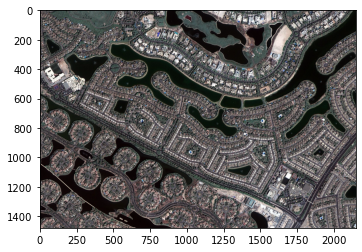

In [7]:
file_names = np.sort(os.listdir(images_dir)) 
# print(file_names)
# print(len(file_names))
file_names = np.char.split(file_names, '.')
filenames = np.array([])
# print(file_names[7])
# print(file_names[7][0])
for i in range(len(file_names)):
    filenames = np.append(filenames, file_names[i][0])
print(filenames)

# img = cv2.imread(images_dir+filenames[0]+'.jpg')
# print(img)
# plt.imshow(img)

for file in filenames:
    img = cv2.imread(images_dir+file+'.jpg')
    
print(images_dir+file+'.jpg')
plt.imshow(img)

In [8]:
def augment_dataset(count):
    '''Function for data augmentation
        Input:
            count - total no. of images after augmentation = initial no. of images * count
        Output:
            writes augmented images (input images & segmentation masks) to the working directory
    '''
    transform_1 = augment(512, 512)
    transform_2 = augment(480, 480)
    transform_3 = augment(512, 512)
    transform_4 = augment(800, 800)
    transform_5 = augment(1024, 1024)
    transform_6 = augment(800, 800)
    transform_7 = augment(1600, 1600)
    transform_8 = augment(1920, 1280)
    
    file_names = np.sort(os.listdir(images_dir)) 
    file_names = np.char.split(file_names, '.')
    filenames = np.array([])
    for i in range(len(file_names)):
        filenames = np.append(filenames, file_names[i][0])
    
    i = 0
    for i in range(count):
        print(f'Count: {i+1}')
        for file in filenames:
            tile = file.split('_')[1]
            img = cv2.imread(images_dir+file+'.jpg')
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            mask = cv2.imread(masks_dir+file+'.png')
            mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
            
            if tile == 't1':
                transformed = transform_1(image=img, mask=mask)
                transformed_image = transformed['image']
                transformed_mask = transformed['mask']
            elif tile =='t2':
                transformed = transform_2(image=img, mask=mask)
                transformed_image = transformed['image']
                transformed_mask = transformed['mask']
            elif tile =='t3':
                transformed = transform_3(image=img, mask=mask)
                transformed_image = transformed['image']
                transformed_mask = transformed['mask']
            elif tile =='t4':
                transformed = transform_4(image=img, mask=mask)
                transformed_image = transformed['image']
                transformed_mask = transformed['mask']
            elif tile =='t5':
                transformed = transform_5(image=img, mask=mask)
                transformed_image = transformed['image']
                transformed_mask = transformed['mask']
            elif tile =='t6':
                transformed = transform_6(image=img, mask=mask)
                transformed_image = transformed['image']
                transformed_mask = transformed['mask']
            elif tile =='t7':
                transformed = transform_7(image=img, mask=mask)
                transformed_image = transformed['image']
                transformed_mask = transformed['mask']
            elif tile =='t8':
                transformed = transform_8(image=img, mask=mask)
                transformed_image = transformed['image']
                transformed_mask = transformed['mask']
                    
            cv2.imwrite('./Augmented_data/aug_train_images/aug_{}_'.format(str(i+1))+file+'.jpg',cv2.cvtColor(transformed_image, cv2.COLOR_BGR2RGB))
            cv2.imwrite('./Augmented_data/aug_train_masks/aug_{}_'.format(str(i+1))+file+'.png',cv2.cvtColor(transformed_mask, cv2.COLOR_BGR2RGB))
            
            # one redudant train for keras dir struct
            cv2.imwrite('./Augmented_data/train_images/train/aug_{}_'.format(str(i+1))+file+'.jpg',cv2.cvtColor(transformed_image, cv2.COLOR_BGR2RGB))
            cv2.imwrite('./Augmented_data/train_masks/train/aug_{}_'.format(str(i+1))+file+'.png',cv2.cvtColor(transformed_mask, cv2.COLOR_BGR2RGB))

In [9]:
!mkdir "./Augmented_data/aug_train_images/"
!mkdir "./Augmented_data/aug_train_masks/"
!mkdir "./Augmented_data/train_images/train/"
!mkdir "./Augmented_data/train_masks/train/"
augment_dataset(8)

A subdirectory or file ./Augmented_data/aug_train_images/ already exists.
A subdirectory or file ./Augmented_data/aug_train_masks/ already exists.
A subdirectory or file ./Augmented_data/train_images/train/ already exists.
A subdirectory or file ./Augmented_data/train_masks/train/ already exists.


Count: 1
Count: 2
Count: 3
Count: 4
Count: 5
Count: 6
Count: 7
Count: 8


In [10]:
# Constructing the Data directory file structure
# Iterating through all the 8 tiles
for tile in range(1, 8+1):
    # Iterating through 7 images in each tile (leaving 2 for validation)
    for i in range(1, 7+1):
        src_img = f'./Semantic segmentation dataset/Tile {tile}/images/image_part_00{i}.jpg'
        src_mask = f'./Semantic segmentation dataset/Tile {tile}/masks/image_part_00{i}.png'
        dest_img = f'./Augmented_data/train_images/train/image_t{tile}_00{i}.jpg'
        dest_mask = f'./Augmented_data/train_masks/train/image_t{tile}_00{i}.png'
        os.makedirs(os.path.dirname(dest_img), exist_ok=True)
        os.makedirs(os.path.dirname(dest_mask), exist_ok=True)
        new_path_img = shutil.copy(src_img, dest_img)
        new_path_mask = shutil.copy(src_mask, dest_mask)
        print(new_path_img)
        print(new_path_mask)

./Augmented_data/train_images/train/image_t1_001.jpg
./Augmented_data/train_masks/train/image_t1_001.png
./Augmented_data/train_images/train/image_t1_002.jpg
./Augmented_data/train_masks/train/image_t1_002.png
./Augmented_data/train_images/train/image_t1_003.jpg
./Augmented_data/train_masks/train/image_t1_003.png
./Augmented_data/train_images/train/image_t1_004.jpg
./Augmented_data/train_masks/train/image_t1_004.png
./Augmented_data/train_images/train/image_t1_005.jpg
./Augmented_data/train_masks/train/image_t1_005.png
./Augmented_data/train_images/train/image_t1_006.jpg
./Augmented_data/train_masks/train/image_t1_006.png
./Augmented_data/train_images/train/image_t1_007.jpg
./Augmented_data/train_masks/train/image_t1_007.png
./Augmented_data/train_images/train/image_t2_001.jpg
./Augmented_data/train_masks/train/image_t2_001.png
./Augmented_data/train_images/train/image_t2_002.jpg
./Augmented_data/train_masks/train/image_t2_002.png
./Augmented_data/train_images/train/image_t2_003.jpg
./

In [11]:
# Constructing the Data directory file structure
# Iterating through all the 8 tiles
for tile in range(1, 8+1):
    # Obtaining the last 2 images for validation in each tile
    for i in range(8, 9+1):
        src_img = f'./Semantic segmentation dataset/Tile {tile}/images/image_part_00{i}.jpg'
        src_mask = f'./Semantic segmentation dataset/Tile {tile}/masks/image_part_00{i}.png'
        dest_img = f'./Augmented_data/val_images/val/image_t{tile}_00{i}.jpg'
        dest_mask = f'./Augmented_data/val_masks/val/image_t{tile}_00{i}.png'
        os.makedirs(os.path.dirname(dest_img), exist_ok=True)
        os.makedirs(os.path.dirname(dest_mask), exist_ok=True)
        new_path_img = shutil.copy(src_img, dest_img)
        new_path_mask = shutil.copy(src_mask, dest_mask)
        print(new_path_img)
        print(new_path_mask)

./Augmented_data/val_images/val/image_t1_008.jpg
./Augmented_data/val_masks/val/image_t1_008.png
./Augmented_data/val_images/val/image_t1_009.jpg
./Augmented_data/val_masks/val/image_t1_009.png
./Augmented_data/val_images/val/image_t2_008.jpg
./Augmented_data/val_masks/val/image_t2_008.png
./Augmented_data/val_images/val/image_t2_009.jpg
./Augmented_data/val_masks/val/image_t2_009.png
./Augmented_data/val_images/val/image_t3_008.jpg
./Augmented_data/val_masks/val/image_t3_008.png
./Augmented_data/val_images/val/image_t3_009.jpg
./Augmented_data/val_masks/val/image_t3_009.png
./Augmented_data/val_images/val/image_t4_008.jpg
./Augmented_data/val_masks/val/image_t4_008.png
./Augmented_data/val_images/val/image_t4_009.jpg
./Augmented_data/val_masks/val/image_t4_009.png
./Augmented_data/val_images/val/image_t5_008.jpg
./Augmented_data/val_masks/val/image_t5_008.png
./Augmented_data/val_images/val/image_t5_009.jpg
./Augmented_data/val_masks/val/image_t5_009.png
./Augmented_data/val_images/va

In [12]:
# Constructing the Data directory file structure
# Iterating through all the 8 tiles
for tile in range(1, 8+1):
    # Iterating through 7 images in each tile (leaving 2 for validation)
    for i in range(1, 7+1):
        src_img = f'./Semantic segmentation dataset/Tile {tile}/images/image_part_00{i}.jpg'
        src_mask = f'./Semantic segmentation dataset/Tile {tile}/masks/image_part_00{i}.png'
        dest_img = f'./Augmented_data/orig_train_images/image_t{tile}_00{i}.jpg'
        dest_mask = f'./Augmented_data/orig_train_masks/image_t{tile}_00{i}.png'
        os.makedirs(os.path.dirname(dest_img), exist_ok=True)
        os.makedirs(os.path.dirname(dest_mask), exist_ok=True)
        new_path_img = shutil.copy(src_img, dest_img)
        new_path_mask = shutil.copy(src_mask, dest_mask)
        print(new_path_img)
        print(new_path_mask)

./Augmented_data/orig_train_images/image_t1_001.jpg
./Augmented_data/orig_train_masks/image_t1_001.png
./Augmented_data/orig_train_images/image_t1_002.jpg
./Augmented_data/orig_train_masks/image_t1_002.png
./Augmented_data/orig_train_images/image_t1_003.jpg
./Augmented_data/orig_train_masks/image_t1_003.png
./Augmented_data/orig_train_images/image_t1_004.jpg
./Augmented_data/orig_train_masks/image_t1_004.png
./Augmented_data/orig_train_images/image_t1_005.jpg
./Augmented_data/orig_train_masks/image_t1_005.png
./Augmented_data/orig_train_images/image_t1_006.jpg
./Augmented_data/orig_train_masks/image_t1_006.png
./Augmented_data/orig_train_images/image_t1_007.jpg
./Augmented_data/orig_train_masks/image_t1_007.png
./Augmented_data/orig_train_images/image_t2_001.jpg
./Augmented_data/orig_train_masks/image_t2_001.png
./Augmented_data/orig_train_images/image_t2_002.jpg
./Augmented_data/orig_train_masks/image_t2_002.png
./Augmented_data/orig_train_images/image_t2_003.jpg
./Augmented_data/orig

# Working with Augmented Dataset

In [13]:
train_images = "./Augmented_data/train_images/train/"
train_masks = "./Augmented_data/train_masks/train/"
val_images = "./Augmented_data/val_images/val/"
val_masks = "./Augmented_data/val_masks/val/"
aug_train_images = "./Augmented_data/aug_train_images/"
aug_train_masks = "./Augmented_data/aug_train_masks/"

In [14]:
file_names = np.sort(os.listdir(train_images)) 
# print(file_names)
# print(len(file_names))
file_names = np.char.split(file_names, '.')
filenames = np.array([])
# print(file_names[7])
# print(file_names[7][0])
for i in range(len(file_names)):
    filenames = np.append(filenames, file_names[i][0])
print(file_names)

[list(['aug_1_image_t1_001', 'jpg']) list(['aug_1_image_t1_002', 'jpg'])
 list(['aug_1_image_t1_003', 'jpg']) list(['aug_1_image_t1_004', 'jpg'])
 list(['aug_1_image_t1_005', 'jpg']) list(['aug_1_image_t1_006', 'jpg'])
 list(['aug_1_image_t1_007', 'jpg']) list(['aug_1_image_t2_001', 'jpg'])
 list(['aug_1_image_t2_002', 'jpg']) list(['aug_1_image_t2_003', 'jpg'])
 list(['aug_1_image_t2_004', 'jpg']) list(['aug_1_image_t2_005', 'jpg'])
 list(['aug_1_image_t2_006', 'jpg']) list(['aug_1_image_t2_007', 'jpg'])
 list(['aug_1_image_t3_001', 'jpg']) list(['aug_1_image_t3_002', 'jpg'])
 list(['aug_1_image_t3_003', 'jpg']) list(['aug_1_image_t3_004', 'jpg'])
 list(['aug_1_image_t3_005', 'jpg']) list(['aug_1_image_t3_006', 'jpg'])
 list(['aug_1_image_t3_007', 'jpg']) list(['aug_1_image_t4_001', 'jpg'])
 list(['aug_1_image_t4_002', 'jpg']) list(['aug_1_image_t4_003', 'jpg'])
 list(['aug_1_image_t4_004', 'jpg']) list(['aug_1_image_t4_005', 'jpg'])
 list(['aug_1_image_t4_006', 'jpg']) list(['aug_1_i

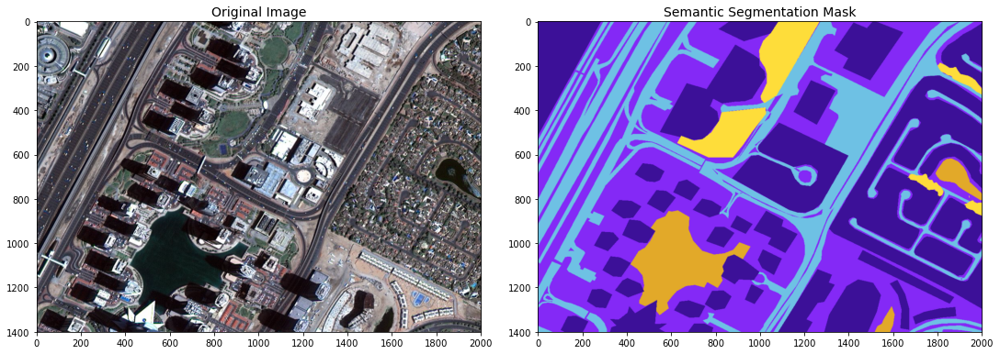

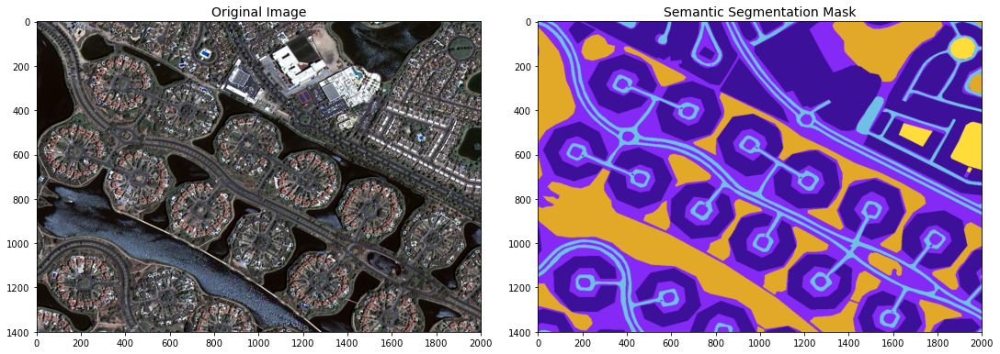

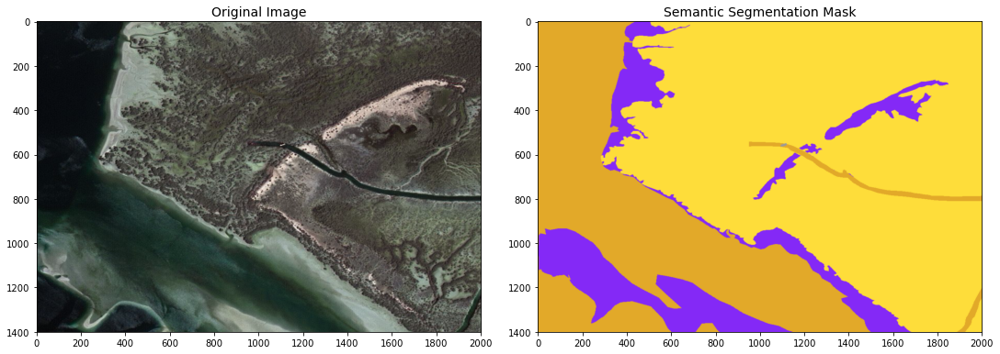

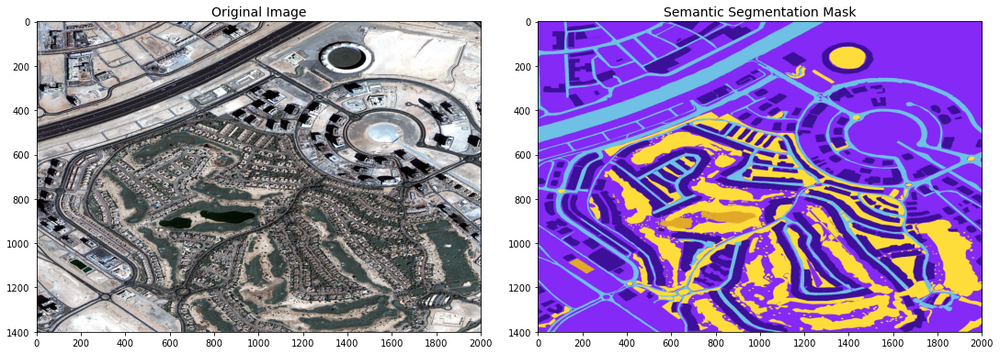

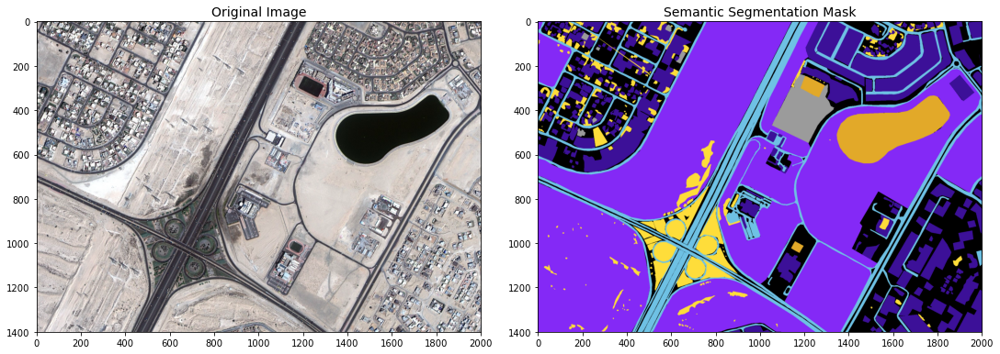

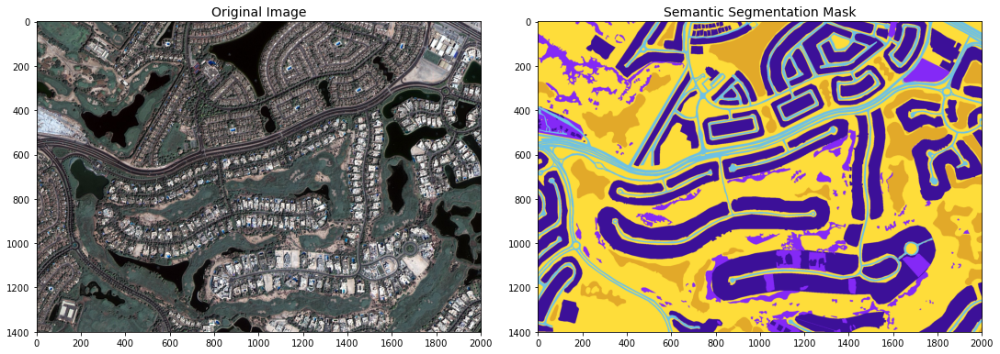

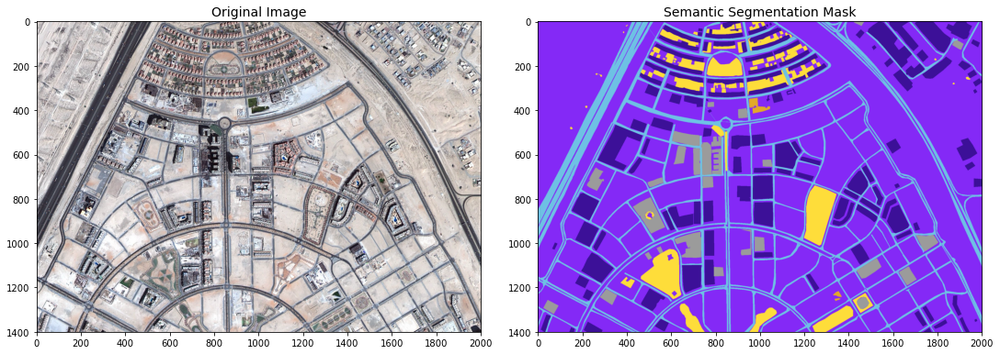

In [15]:
def show_data(files, original_images_dir, label_images_dir):

    for file in files:
        fig, axs = plt.subplots(1, 2, figsize=(15, 6), constrained_layout=True)
        
        axs[0].imshow(cv2.resize(cv2.imread(original_images_dir+str(file)+'.jpg'), (2000,1400)))
        axs[0].set_title('Original Image', fontdict = {'fontsize':14, 'fontweight': 'medium'})
        axs[0].set_xticks(np.arange(0, 2001, 200))
        axs[0].set_yticks(np.arange(0, 1401, 200))
        axs[0].grid(False)
        axs[0].axis(True)

        semantic_label_image = cv2.imread(label_images_dir+str(file)+'.png')
        semantic_label_image = cv2.cvtColor(semantic_label_image, cv2.COLOR_BGR2RGB)
        semantic_label_image = cv2.resize(semantic_label_image, (2000,1400))
        axs[1].imshow(semantic_label_image)
        axs[1].set_title('Semantic Segmentation Mask', fontdict = {'fontsize':14, 'fontweight': 'medium'})
        axs[1].set_xticks(np.arange(0, 2001, 200))
        axs[1].set_yticks(np.arange(0, 1401, 200))
        axs[1].grid(False)
        axs[1].axis(True)

        plt.savefig('./Output/sample_'+file, facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 100)
        plt.show()

        
files = ['image_t4_001', 'image_t4_005', 'image_t6_002', 'image_t7_002', 'image_t8_003', 'image_t8_004', 'image_t8_006']    
show_data(files, train_images, train_masks)    

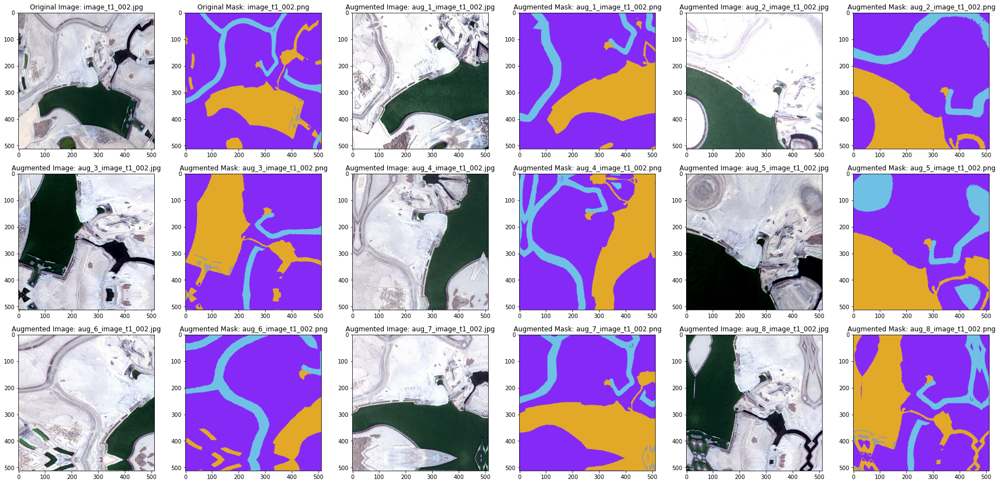

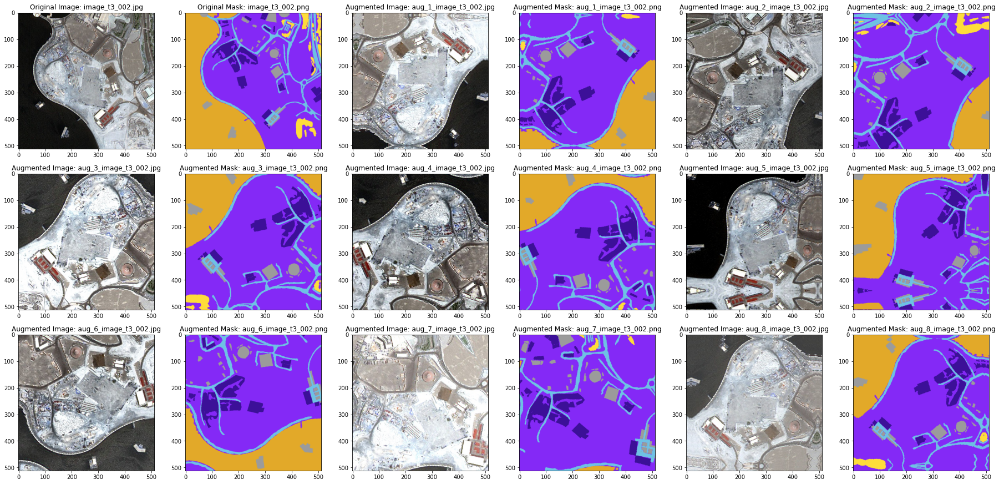

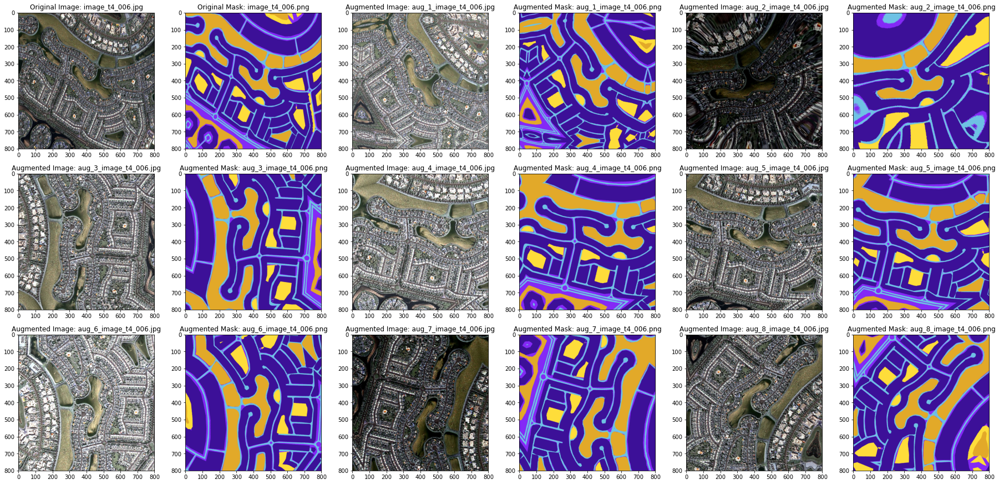

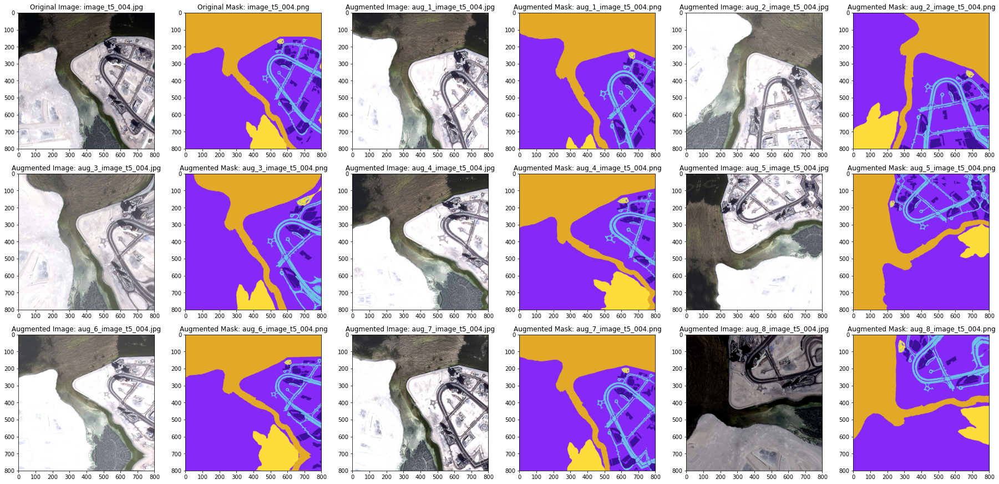

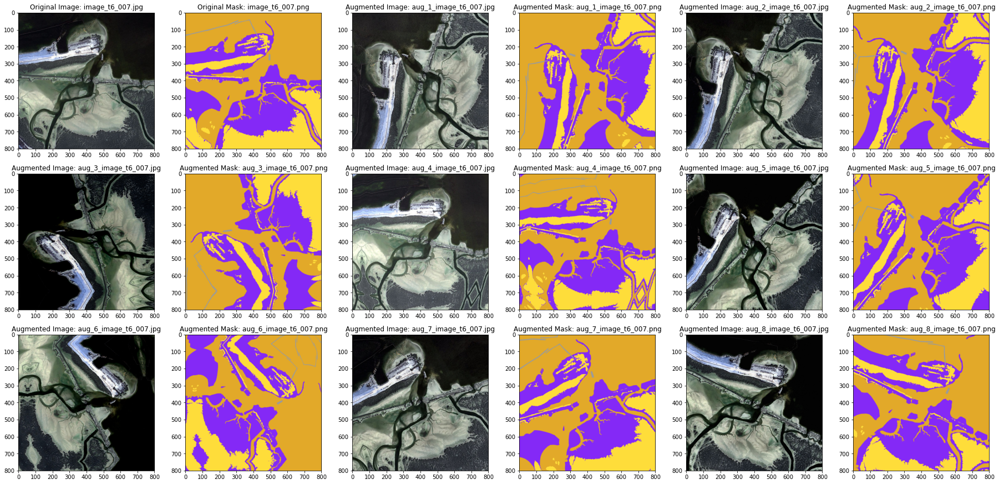

In [16]:
augmented_files = ['image_t1_002', 'image_t3_002', 'image_t4_006', 'image_t5_004', 'image_t6_007']
dims = np.array([(512, 512), (512, 512), (800, 800), (800, 800), (800, 800)])

def show_augmented_images(files, original_images_dir, label_images_dir):
    dim_index = 0
    for file in files:
        count_img = 1
        count_msk = 1
        fig, axs = plt.subplots(3, 6, figsize=(25, 12), constrained_layout=True)
        for i in range(3):
            for j in range(6):
                if i == 0 and j == 0:
                    axs[i][j].imshow(cv2.resize(cv2.cvtColor(cv2.imread(original_images_dir+str(file)+'.jpg'), cv2.COLOR_BGR2RGB), tuple(dims[dim_index])))
                    axs[i][j].set_title('Original Image: {}.jpg'.format(file), fontdict = {'fontsize':12, 'fontweight': 'medium'})
                    axs[i][j].set_xticks(np.arange(0, dims[dim_index][0]+1, 100))
                    axs[i][j].set_yticks(np.arange(0, dims[dim_index][1]+1, 100))
                    axs[i][j].grid(False)
                    axs[i][j].axis(True)
                elif i == 0 and j == 1:
                    axs[i][j].imshow(cv2.resize(cv2.cvtColor(cv2.imread(label_images_dir+str(file)+'.png'), cv2.COLOR_BGR2RGB), tuple(dims[dim_index])))
                    axs[i][j].set_title('Original Mask: {}.png'.format(file), fontdict = {'fontsize':12, 'fontweight': 'medium'})
                    axs[i][j].set_xticks(np.arange(0, dims[dim_index][0]+1, 100))
                    axs[i][j].set_yticks(np.arange(0, dims[dim_index][1]+1, 100))
                    axs[i][j].grid(False)
                    axs[i][j].axis(True)
                else:
                    if j%2 == 0:
                        axs[i][j].imshow(cv2.resize(cv2.cvtColor(cv2.imread(original_images_dir+'aug_'+str(count_img)+'_'+str(file)+'.jpg'), cv2.COLOR_BGR2RGB), tuple(dims[dim_index])))
                        axs[i][j].set_title('Augmented Image: aug_{}.jpg'.format(str(count_img)+'_'+str(file)), fontdict = {'fontsize':12, 'fontweight': 'medium'})
                        axs[i][j].set_xticks(np.arange(0, dims[dim_index][0]+1, 100))
                        axs[i][j].set_yticks(np.arange(0, dims[dim_index][1]+1, 100))
                        axs[i][j].grid(False)
                        axs[i][j].axis(True)
                        count_img += 1
                    elif j%2 != 0:
                        axs[i][j].imshow(cv2.resize(cv2.cvtColor(cv2.imread(label_images_dir+'aug_'+str(count_msk)+'_'+str(file)+'.png'), cv2.COLOR_BGR2RGB), tuple(dims[dim_index])))
                        axs[i][j].set_title('Augmented Mask: aug_{}.png'.format(str(count_msk)+'_'+str(file)), fontdict = {'fontsize':12, 'fontweight': 'medium'})
                        axs[i][j].set_xticks(np.arange(0, dims[dim_index][0]+1, 100))
                        axs[i][j].set_yticks(np.arange(0, dims[dim_index][1]+1, 100))
                        axs[i][j].grid(False)
                        axs[i][j].axis(True)
                        count_msk += 1

        plt.savefig('./Output/aug_image_'+file, facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 100)
        dim_index += 1
        plt.show()

show_augmented_images(augmented_files, train_images, train_masks)